# Introduction/Business Problem

Lisbon has a increasing bike paths and bike users in the last years. Concerning the geography of the city I will start by analysing the elevation variation on the city and them study the interest points in order to predict the best opportunities to commercial exploration of the paths.

## Installing and importing

In [2]:
!conda install -c conda-forge folium=0.5.0 --yes
!pip install geopandas
!pip install branca
#!pip install basemap
!pip install colour
!pip install foursquare 

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.9.0
  latest version: 4.9.2

Please update conda by running

    $ conda update -n base conda



# All requested packages already installed.



In [24]:
import numpy as np  # useful for many scientific computing in Python
import pandas as pd # primary data structure library
import folium
import requests
import json
import matplotlib.pyplot as plt
#from mpl_toolkits.basemap import Basemap
import geopandas as gpd
import pandas as pd
import branca.colormap as cmp
import branca
import json, requests

from IPython.display import clear_output, display

import seaborn as sns
import matplotlib.pyplot as plt


import foursquare
from math import radians, cos, sin, asin, sqrt

print('Everything installed and imported!')

Everything installed and imported!


## Downloading the data from dados.gov.pt

In [5]:
r = requests.get('https://dados.gov.pt/pt/datasets/r/91076b84-ab0f-4c60-a4bb-a8d2cb0bce3f')
r.json()
print('GeoJSON file downloaded!')

GeoJSON file downloaded!


## Just looking at lisbon ;)

In [6]:
lisbon_map = folium.Map()

#lisbon_map = folium.Map(location=[38.736950, -9.142685], zoom_start=12,  tiles='Stamen Terrain')
lisbon_map = folium.Map(location=[38.736950, -9.142685], zoom_start=12,  tiles='OpenStreetMap')




## Preparing the data

In [7]:
#Converting to json
a = json.loads(r.text)
j = r.json()

#Parsing the json 
raw_df = pd.DataFrame.from_dict(j)['features']

df =  pd.DataFrame(columns=['name','id','coordinates','properties'])

for i in range(len(raw_df)-1):
    
    nome=raw_df[i]['properties']['DESIGNACAO']
    path_id=raw_df[i]['id']
    coordinates=raw_df[i]['geometry']['coordinates']
    properties=raw_df[i]['properties']

    df=df.append({'name': nome, 'id': path_id, 'coordinates':coordinates,'properties':properties}, ignore_index=True)
    #print(nome, path_id, )
df

,name,id,coordinates,properties
0,Avenida Rovisco Pais,10,"[[-9.13677319714671, 38.7360470816063], [-9.13...","{'OBJECTID': 10, 'COD_VIA': '67117', 'DESIGNAC..."
1,Passeio do Adamastor,18,"[[-9.09408983625328, 38.7585836689644], [-9.09...","{'OBJECTID': 18, 'COD_VIA': '5958', 'DESIGNACA..."
2,Praça do Tejo,20,"[[-9.09205185531767, 38.7759103939952], [-9.09...","{'OBJECTID': 20, 'COD_VIA': '5999', 'DESIGNACA..."
3,Passeio do Tejo,21,"[[-9.09496328167875, 38.7861000329474], [-9.09...","{'OBJECTID': 21, 'COD_VIA': '5942', 'DESIGNACA..."
4,Parque da Bela Vista - Parque hortícola de Chelas,24,"[[-9.12611464138484, 38.7607474889043], [-9.12...","{'OBJECTID': 24, 'COD_VIA': None, 'DESIGNACAO'..."
...,...,...,...,...
628,Monsanto,3118,"[[-9.19373373078562, 38.7249131356125], [-9.19...","{'OBJECTID': 3118, 'COD_VIA': None, 'DESIGNACA..."
629,Parque Florestal de Monsanto,3119,"[[-9.19264767928523, 38.7245111183578], [-9.19...","{'OBJECTID': 3119, 'COD_VIA': '6063', 'DESIGNA..."
630,Avenida Visconde de Valmor,3121,"[[-9.14572760479712, 38.7383336860901], [-9.14...","{'OBJECTID': 3121, 'COD_VIA': '67003', 'DESIGN..."
631,Parque Florestal de Monsanto,3123,"[[-9.19670142402287, 38.7359421131135], [-9.19...","{'OBJECTID': 3123, 'COD_VIA': '6063', 'DESIGNA..."


## Preparing some funcions

In [8]:
def get_coord_by_id(id_nr):
    list = df.loc[df['id']==id_nr]['coordinates'].values.tolist()
     

def get_record_by_id(id_nr):
    record=df.loc[df['id']==id_nr]
    if len(record)==0:
        print('The id is not valid')
    else:
        return record
    
def print_all_coord(id_nr):
    cord_list = df.loc[df['id']==id_nr]['coordinates'].values.tolist()[0]
    for i in range(len(cord_list)-1):
        lng=cord_list[i][0]
        lat=cord_list[i][1]
        print(lat,lng)
        
#print(print_all_coord(10))
#print(df.loc[df['id']==10]['coordinates'].values.tolist())

## Show Bike paths

In [9]:
# instantiate a feature group for the incidents in the dataframe
bike_paths = folium.map.FeatureGroup()

# loop through the 100 crimes and add each to the incidents feature group

#id_nr=10
def draw_bike_path(id_nr):
    cord_list = df.loc[df['id']==id_nr]['coordinates'].values.tolist()[0]
    for i in range(len(cord_list)-1):
        lat=cord_list[i][0]
        lng=cord_list[i][1]      
        print(type(lat),'' , lng)
        bike_paths.add_child(
            folium.features.CircleMarker(
                [lng, lat],
                radius=5, # define how big you want the circle markers to be
                color='yellow',
                fill=True,
                fill_color='#03c6fc',
                fill_opacity=0.6
            )
        )
    #for lat, lng, in zip(df_incidents.Y, df_incidents.X):

    # add incidents to map



for id in df['id']:
    print('\r',df.index[df['id'] == id], 'of', df['id'].size,"                                 " ,end="\r", flush=True)
    draw_bike_path(id)



lisbon_map.add_child(bike_paths)

<class 'float'>  38.7360470816063f 633                                  
<class 'float'>  38.7360124884994
<class 'float'>  38.7359311629598
<class 'float'>  38.7358494988794
<class 'float'>  38.7358003958387
<class 'float'>  38.7357525449544
<class 'float'>  38.7357067772856
<class 'float'>  38.735663999572
<class 'float'>  38.7356226779355
<class 'float'>  38.7355836721667
<class 'float'>  38.7355474776812
<class 'float'>  38.735514034221
<class 'float'>  38.7354824988182
<class 'float'>  38.735453834972
<class 'float'>  38.7354199619233
<class 'float'>  38.7353974875601
<class 'float'>  38.7353774369998
<class 'float'>  38.735360108053
<class 'float'>  38.7353454944149
<class 'float'>  38.7353335477374
<class 'float'>  38.7353244418017
<class 'float'>  38.7353198912859
<class 'float'>  38.735315808855
<class 'float'>  38.7353147626708
<class 'float'>  38.735312025634
<class 'float'>  38.7353103263728
<class 'float'>  38.7353077764298
<class 'float'>  38.7353052264867
<class 'float'>

## Getting elevations

In [10]:
acess_token1='yrEa0KyLXpUmIULsxlnpS4aq9KJ3jhk6njDF7PQ35rt19Ij4NzYq2UtRv5edatqw'
acess_token2='9dTMe31x3sogN66mdXOhDijT24e8hsyNLE1nDdGK4GaWPsd8N4nxS3xskBRlVkAT'
acess_token3='EH4pGEZbIFEanqubIjd8Q0hrGY02NvZ1wNMFnY6BVJbH8xTv4TXNX69WmTWb7PMr'


In [11]:
def get_altitude(lat,lng):
    location=lng+','+lat
    x=0
    elevation=0
    resolution=0
    def get_info():
        link='https://api.jawg.io/elevations?locations='+location+'&access-token='+acess_token
        r = requests.get(link).json()
        elevation=r[0]['elevation']
        resolution=r[0]['resolution']
        
        print(elevation, resolution)
        return elevation, resolution
        
    try:
        acess_token=acess_token1
        return(get_info())
        print('try1')
    
    except:
        try:
            acess_token=acess_token2
            return(get_info())
            print('try2')
            
        except:
            acess_token=acess_token3
            return(get_info())
            print('try3')    
    
print(get_altitude('39.736', '-9.13683875'))
    
   

0.0 9.433398658712427
(0.0, 9.433398658712427)


## Add altitude to DataFrame

In [12]:
df2 =  pd.DataFrame(columns=['id','latitude','longitude','altitude'])
df

,name,id,coordinates,properties
0,Avenida Rovisco Pais,10,"[[-9.13677319714671, 38.7360470816063], [-9.13...","{'OBJECTID': 10, 'COD_VIA': '67117', 'DESIGNAC..."
1,Passeio do Adamastor,18,"[[-9.09408983625328, 38.7585836689644], [-9.09...","{'OBJECTID': 18, 'COD_VIA': '5958', 'DESIGNACA..."
2,Praça do Tejo,20,"[[-9.09205185531767, 38.7759103939952], [-9.09...","{'OBJECTID': 20, 'COD_VIA': '5999', 'DESIGNACA..."
3,Passeio do Tejo,21,"[[-9.09496328167875, 38.7861000329474], [-9.09...","{'OBJECTID': 21, 'COD_VIA': '5942', 'DESIGNACA..."
4,Parque da Bela Vista - Parque hortícola de Chelas,24,"[[-9.12611464138484, 38.7607474889043], [-9.12...","{'OBJECTID': 24, 'COD_VIA': None, 'DESIGNACAO'..."
...,...,...,...,...
628,Monsanto,3118,"[[-9.19373373078562, 38.7249131356125], [-9.19...","{'OBJECTID': 3118, 'COD_VIA': None, 'DESIGNACA..."
629,Parque Florestal de Monsanto,3119,"[[-9.19264767928523, 38.7245111183578], [-9.19...","{'OBJECTID': 3119, 'COD_VIA': '6063', 'DESIGNA..."
630,Avenida Visconde de Valmor,3121,"[[-9.14572760479712, 38.7383336860901], [-9.14...","{'OBJECTID': 3121, 'COD_VIA': '67003', 'DESIGN..."
631,Parque Florestal de Monsanto,3123,"[[-9.19670142402287, 38.7359421131135], [-9.19...","{'OBJECTID': 3123, 'COD_VIA': '6063', 'DESIGNA..."


In [13]:

def get_data(id_nr):
    cord_list = df.loc[df['id']==id_nr]['coordinates'].values.tolist()[0]
    for i in range(len(cord_list)-1):
        lng=cord_list[i][0]
        lat=cord_list[i][1]      
        alt=get_altitude(str(lat),str(lng))
        #alt=123
        #df=df.append({'id': id_nr, 'latitude':coordinates,'longitude':properties}, ignore_index=True)
        
        #save values
        #save values
        f = open('elevation_values.csv', 'a') 
        f.write(str(id_nr)+','+str(lat)+','+str(lng)+','+str(alt)[1:-1]+'\n')
        f.close()
        print(str(id_nr)+','+str(lat)+','+str(lng)+','+str(alt)[1:-1]+'\n')
        
#for id in df['id']:
    #print(df.index[df['id'] == id], 'of', df['id'].size, end="\r", flush=True)
#    get_data(id)


## import the new dataset

In [14]:
df_elevation=pd.read_csv('bike_paths_elevation_values.csv',  sep=';',decimal=',')
df_elevation

,id,latitude,longitude,Elevation
0,10,38.735253,-9.141415,282.9004
1,10,38.735256,-9.141323,283.2998
2,10,38.735258,-9.141220,283.7002
3,10,38.735261,-9.141117,284.0000
4,10,38.735264,-9.140979,283.5000
...,...,...,...,...
16892,3123,38.737089,-9.190419,323.6006
16893,3123,38.737090,-9.191907,324.2998
16894,3123,38.737104,-9.190474,323.6006
16895,3123,38.737113,-9.190582,323.4004


In [15]:
df_elevation.describe(include='all')

,id,latitude,longitude,Elevation
count,16897.000000,16897.000000,16897.000000,16897.000000
mean,1648.826833,38.745051,-9.152311,283.940342
std,852.855767,0.019814,0.031436,23.264441
min,10.000000,38.691880,-9.228815,208.900390
25%,894.000000,38.733371,-9.180934,266.799800
50%,1673.000000,38.748497,-9.152895,282.500000
75%,2356.000000,38.759892,-9.122506,304.100600
max,3128.000000,38.795509,-9.090616,343.000000


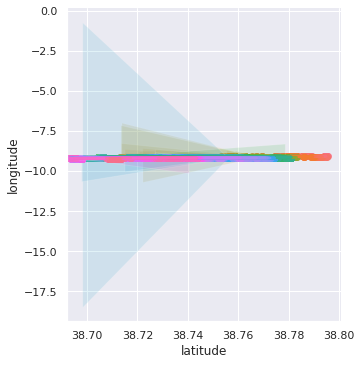

In [16]:
sns.set_theme()


data=df_elevation

g = sns.lmplot(
    data=data,
    x='latitude',
    y='longitude',
    hue='Elevation')
g._legend.remove()
    
    
    
    

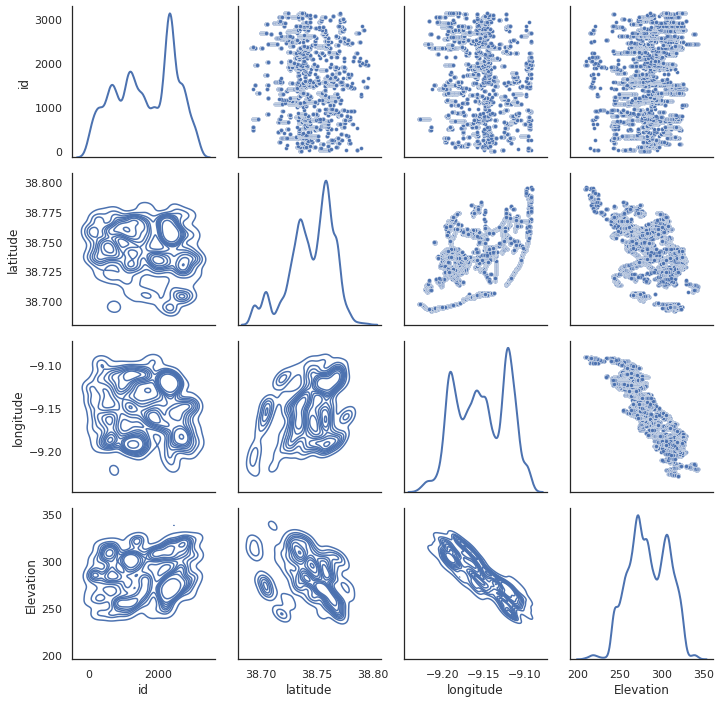

In [17]:
sns.set_theme(style="white")

df = df_elevation

g = sns.PairGrid(df, diag_sharey=False)
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=2)

In [18]:
df_condensed=df_elevation[['latitude','longitude','Elevation']]


In [114]:
## Foursquare 

def request(parameters):
    if not isinstance(parameters, dict):
        print('input "parms" must be a dictionary' )
    auth = {    
    "client_id" : "4EZHOE5IJ5CZDT5L1DRVX4TKO0VKP0K0QEEH0FATSJVOGCQB",
    'client_secret' : 'PRSHVXSLHR55CJ1VYHEVCEMLW4OZSXZBVETCFAHWXS21L1YD',
    'v':'20180322' ,    
    }
    url = 'https://api.foursquare.com/v2/venues/explore'
    #create the final dic
    auth.update(parameters)
   
    resp = requests.get(url=url, params=auth)
    return json.loads(resp.text)

def get_vanue_by_coord(lat, lng, limit=1):
    parameters=dict(
        ll=str(lat)+','+str(lng),
        limit=str(limit)# ,
        #query='coffee'
    )
    
    return request(parameters)
    
get_vanue_by_coord('38.750480', '-9.301815')    


{'client_id': '4EZHOE5IJ5CZDT5L1DRVX4TKO0VKP0K0QEEH0FATSJVOGCQB', 'client_secret': 'PRSHVXSLHR55CJ1VYHEVCEMLW4OZSXZBVETCFAHWXS21L1YD', 'v': '20180322', 'll': '38.750480,-9.301815', 'limit': '1'}
<Response [200]>


{'meta': {'code': 200, 'requestId': '5fb81d88c4e5cf3a83e7850d'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'warning': {'text': "There aren't a lot of results near you. Try something more general, reset your filters, or expand the search area."},
  'suggestedRadius': 4343,
  'headerLocation': 'São Marcos',
  'headerFullLocation': 'São Marcos',
  'headerLocationGranularity': 'city',
  'totalResults': 138,
  'suggestedBounds': {'ne': {'lat': 38.75278542945922,
    'lng': -9.298821127810832},
   'sw': {'lat': 38.750085769673774, 'lng': -9.304268888587767}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '55d9b43f498e8a31534bc107',
       'name': 'Continente Bom Dia',
       'contact': {},
       'l

In [21]:

from colour import Color
red = Color("green")
colors = list(red.range_to(Color("blue"),350))
bike_paths_elevation=None
lisbon_map_elevation=None
lisbon_map_elevation = folium.Map()

lisbon_map_elevation = folium.Map(location=[38.736950, -9.142685],
                        zoom_start=12,  tiles='Stamen Terrain')
bike_paths_elevation = folium.map.FeatureGroup()

colorscale = branca.colormap.linear.YlOrRd_09.scale(200,350)

    
linear = cmp.LinearColormap(
    ['yellow', 'green', 'purple'],
    vmin=200, vmax=350,
    caption='Color Scale for Map' #Caption for Color scale or Legend
)
# instantiate a feature group for the incidents in the dataframe
bike_paths_elevation = folium.map.FeatureGroup()

# loop through the 100 crimes and add each to the incidents feature group

#id_nr=10
def draw_bike_path_elevation(id_nr):
    
#    for i in range(len(df_elevation.index)-1):
        #print(i, df_elevation.index)

        path_id=int(df_elevation.iloc[id_nr][0])
        lng=float(df_elevation.iloc[id_nr][1])
        lat=float(df_elevation.iloc[id_nr][2])
        elv=float(df_elevation.iloc[id_nr][3])
        
        #print(type(lat), lng, elv, colors[round(elv)])
        
        bike_paths.add_child(
            folium.features.CircleMarker(
                [lat,lng],
                radius=5, # define how big you want the circle markers to be
                color='yellow',
                fill=True,
                fill_color= str(colors[round(elv)]) ,
                fill_opacity=0.6
            )
        )
    #for lat, lng, in zip(df_incidents.Y, df_incidents.X):

    # add incidents to map



for id in range(len(df_elevation.index)):
    #print(df.index[df['id'] == id], 'of', df['id'].size,' [%d%%]\r'%i, end="")
    #clear_output(wait=True)
    
    #print (df.index[df['id'] == id],len(df_elevation.index))
    draw_bike_path_elevation(id)



lisbon_map_elevation.add_child(bike_paths_elevation)

In [119]:

def haversine_distance(lat1, lon1, lat2, lon2):

      R = 6372.8 #Earth radius in kilometers 
      dLat = radians(lat2 - lat1)
      dLon = radians(lon2 - lon1)
      lat1 = radians(lat1)
      lat2 = radians(lat2)
      a = sin(dLat/2)**2 + cos(lat1)*cos(lat2)*sin(dLon/2)**2
      c = 2*asin(sqrt(a))
      return R * c

x,y =38.750923, -9.305731
xx, yy=38.747400, -9.303607

print(haversine_distance(x,y,xx,yy))

0.4330049043872228


In [ ]:
## once the foursquase api is limited, i'm going to check how many point are at least half kilometer apart

In [120]:
df_elevation

,id,latitude,longitude,Elevation
0,10,38.735253,-9.141415,282.9004
1,10,38.735256,-9.141323,283.2998
2,10,38.735258,-9.141220,283.7002
3,10,38.735261,-9.141117,284.0000
4,10,38.735264,-9.140979,283.5000
...,...,...,...,...
16892,3123,38.737089,-9.190419,323.6006
16893,3123,38.737090,-9.191907,324.2998
16894,3123,38.737104,-9.190474,323.6006
16895,3123,38.737113,-9.190582,323.4004


In [ ]:
class pandas.DataFrame(data=None, index=None, columns=None, dtype=None, copy=False)
distancedf=pd.DataFrame[ columns=["id","latitude","longitude","Elevation"]